In [5]:
import tensorflow as tf
tf.__version__


'2.16.1'

In [6]:
import keras
keras.__version__

'3.1.1'

# <p><center style="font-family:newtimeroman;font-size:180%;">Alzheimer's Detection From MRIs Using Image Analysis </center></p>


### Table of contents:

* Import Libraries
* Read Data
* Visualization Of Dataset
* Data Augmentation
* InceptionV3 Model
* Evaluate The Model

# Import Libraries

In [7]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
import tensorflow as tf
import keras
from tensorflow.keras.utils import plot_model
from keras.callbacks import EarlyStopping,ModelCheckpoint
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Dropout
from tensorflow.keras.models import Model
import tensorflow 
import pickle


# Read Data

In [8]:
images = []
labels = []
for subfolder in tqdm(os.listdir('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset')):
    subfolder_path = os.path.join('/kaggle/input/alzheimers-dataset-4-class-of-images/Alzheimer_s Dataset', subfolder)
    for folder in os.listdir(subfolder_path):
        subfolder_path2=os.path.join(subfolder_path,folder)
        for image_filename in os.listdir(subfolder_path2):
            image_path = os.path.join(subfolder_path2, image_filename)
            images.append(image_path)
            labels.append(folder)
df = pd.DataFrame({'image': images, 'label': labels})
df

100%|██████████| 2/2 [00:00<00:00,  4.85it/s]


,image,label
0,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
1,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
2,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
3,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
4,/kaggle/input/alzheimers-dataset-4-class-of-im...,ModerateDemented
...,...,...
6395,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented
6396,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented
6397,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented
6398,/kaggle/input/alzheimers-dataset-4-class-of-im...,MildDemented


**plot number of samples per class**

# Dataset Visualisation

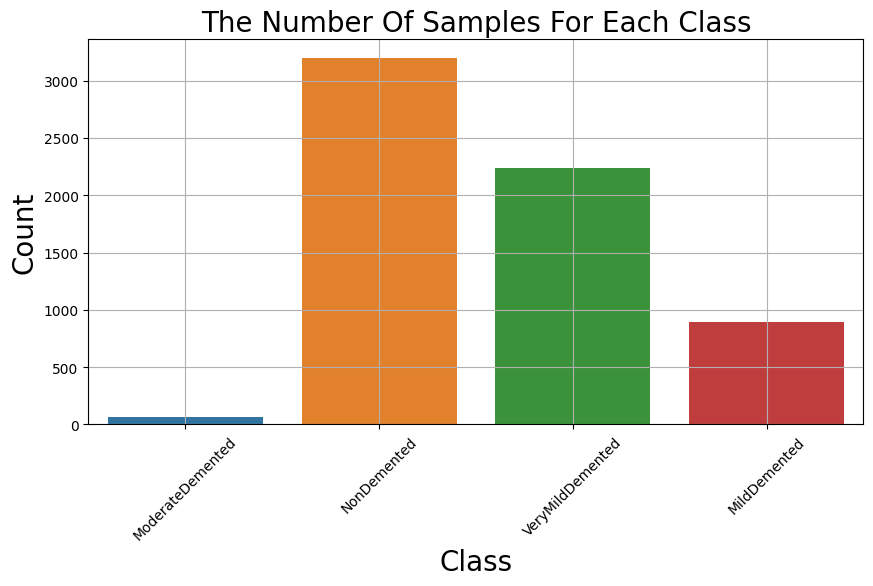

In [9]:
plt.figure(figsize=(10,5))
ax=sns.countplot(x=df.label)
plt.title('The Number Of Samples For Each Class',fontsize=20)
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()


**Random Samples**

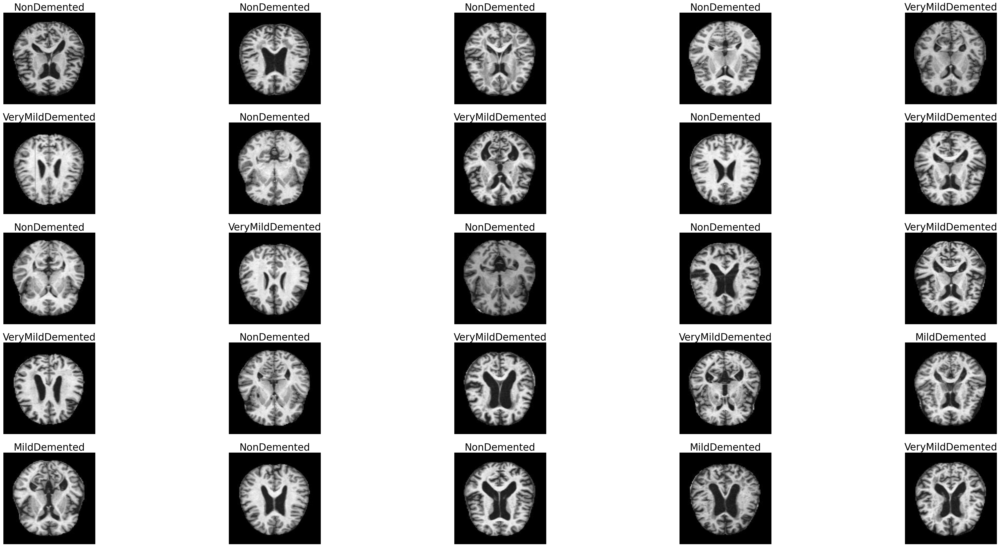

In [10]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(df),25)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25)

# Data Augmentation

In [11]:
Size=(176,176)
work_dr = ImageDataGenerator(
    rescale = 1./255
)
train_data_gen = work_dr.flow_from_dataframe(df,x_col='image',y_col='label', target_size=Size, batch_size=6500, shuffle=False)

for i in range(len(train_data_gen)):
    train_data, train_labels = train_data_gen[i]


Found 6400 validated image filenames belonging to 4 classes.


In [12]:
train_data, train_labels = next(train_data_gen) #fetch the next batch of data and labels from the generator

In [13]:
class_num=np.sort(['MildDemented','ModerateDemented','NonDemented','VeryMildDemented'])
class_num

array(['MildDemented', 'ModerateDemented', 'NonDemented',
       'VeryMildDemented'], dtype='<U16')

**SMOTE** (Synthetic Minority Over-sampling Technique), which is a method used for balancing class distribution by generating synthetic samples from the minority class. 

In [14]:
sm = SMOTE(random_state=42)
train_data, train_labels = sm.fit_resample(train_data.reshape(-1, 176 * 176 * 3), train_labels)
train_data = train_data.reshape(-1, 176,176, 3)
print(train_data.shape, train_labels.shape)

(12800, 176, 176, 3) (12800, 4)


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


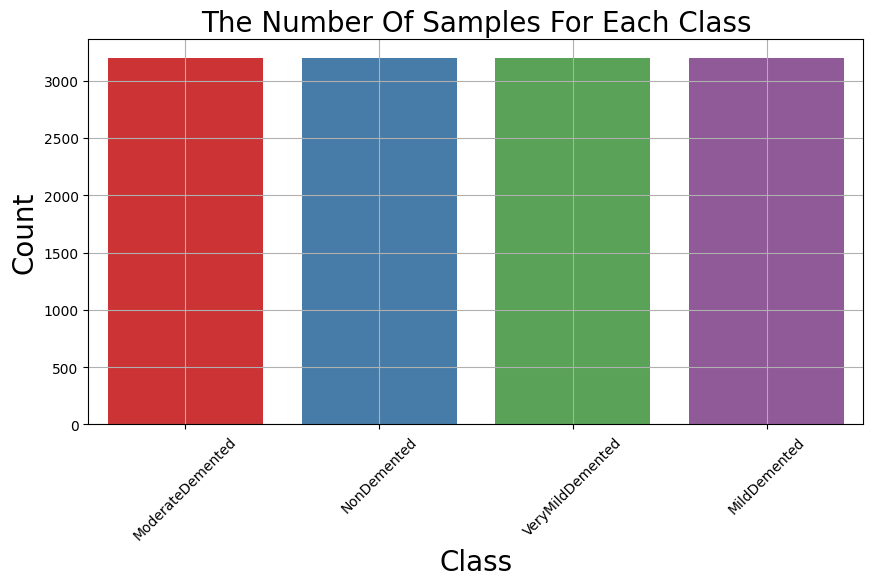

In [15]:
labels=[class_num[i] for i in np.argmax(train_labels,axis=1) ]
plt.figure(figsize=(10,5))
ax = sns.countplot(x=labels,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

**Data Splitting**

train-validation-test sets (0.7 , 0.15 , 0.15)

In [16]:
X_train, X_test1, y_train, y_test1 = train_test_split(train_data,train_labels, test_size=0.3, random_state=42,shuffle=True,stratify=train_labels)
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('X_val shape is ' , X_val.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)
print('y_val shape is ' , y_val.shape)

X_train shape is  (8960, 176, 176, 3)
X_test shape is  (1920, 176, 176, 3)
X_val shape is  (1920, 176, 176, 3)
y_train shape is  (8960, 4)
y_test shape is  (1920, 4)
y_val shape is  (1920, 4)


# Models

# 2. ****VGG19****

* VGG19 is a convolutional neural network architecture, it is an extension of the earlier VGG16 model, with 19 layerscompared to VGG16's 16 layers. VGG19 is known for its simplicity and uniform architecture, which consists of multiple convolutional layers followed by max-pooling layers, and finally a few fully connected layers.

* VGG19 has been widely used in various computer vision tasks, including image classification, object detection, and segmentation. While it may not be the most efficient architecture in terms of computational resources, its simplicity and effectiveness make it a popular choice, especially for **transfer learning** and as a baseline for comparison with more complex models.



In [17]:
vgg = VGG19(input_shape=(176,176,3), weights='imagenet', include_top=False)
for layer in vgg.layers:
    layer.trainable = False
x = Flatten()(vgg.output)

prediction = Dense(4, activation='softmax')(x)

modelvgg = Model(inputs=vgg.input, outputs=prediction)
modelvgg.summary()

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 176, 176, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 176, 176, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 176, 176, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 88, 88, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 88, 88, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 88, 88, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 44, 44, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 44, 44, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 44, 44, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 44, 44, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 44, 44, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 22, 22, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 22, 22, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 22, 22, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 22, 22, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 22, 22, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 11, 11, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 11, 11, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 11, 11, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 11, 11, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 11, 11, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 5, 5, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │        51,204 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,075,588 (76.58 MB)

 Trainable params: 51,204 (200.02 KB)

 Non-trainable params: 20,024,384 (76.39 MB)

**Compile The Model**

In [18]:
modelvgg.compile(optimizer='adam',loss=tensorflow.losses.CategoricalCrossentropy(),metrics=['acc'])
callback = keras.callbacks.EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)

**Train The Model**

In [19]:
hist = modelvgg.fit(X_train,y_train, epochs=100, validation_data=(X_val,y_val), callbacks=callback)

Epoch 1/25


I0000 00:00:1712150009.792443     103 service.cc:145] XLA service 0x7f3e1808a9a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1712150009.792488     103 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
2024-04-03 13:13:31.143489: E external/local_xla/xla/service/gpu/buffer_comparator.cc:149] Difference at 61952: 3.99343, expected 3.12231
2024-04-03 13:13:31.143541: E external/local_xla/xla/service/gpu/buffer_comparator.cc:149] Difference at 61953: 5.68884, expected 4.81772
2024-04-03 13:13:31.143550: E external/local_xla/xla/service/gpu/buffer_comparator.cc:149] Difference at 61954: 5.79053, expected 4.9194
2024-04-03 13:13:31.143559: E external/local_xla/xla/service/gpu/buffer_comparator.cc:149] Difference at 61955: 4.65968, expected 3.78855
2024-04-03 13:13:31.143567: E external/local_xla/xla/service/gpu/buffer_comparator.cc:149] Difference at 61956: 5.0873, expected 4.21618
2024-04-03 13:1

  3/280 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - acc: 0.3681 - loss: 1.5497

I0000 00:00:1712150016.665038     103 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


280/280 ━━━━━━━━━━━━━━━━━━━━ 28s 72ms/step - acc: 0.6119 - loss: 0.9195 - val_acc: 0.7984 - val_loss: 0.4832
Epoch 2/25
280/280 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - acc: 0.8260 - loss: 0.4294 - val_acc: 0.8115 - val_loss: 0.4214
Epoch 3/25
280/280 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - acc: 0.8749 - loss: 0.3337 - val_acc: 0.8552 - val_loss: 0.3732
Epoch 4/25
280/280 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - acc: 0.8998 - loss: 0.2840 - val_acc: 0.8953 - val_loss: 0.2853
Epoch 5/25
280/280 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - acc: 0.9255 - loss: 0.2280 - val_acc: 0.9182 - val_loss: 0.2444
Epoch 6/25
280/280 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - acc: 0.9412 - loss: 0.1932 - val_acc: 0.9312 - val_loss: 0.2176
Epoch 7/25
280/280 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - acc: 0.9525 - loss: 0.1691 - val_acc: 0.9109 - val_loss: 0.2389
Epoch 8/25
280/280 ━━━━━━━━━━━━━━━━━━━━ 18s 63ms/step - acc: 0.9456 - loss: 0.1685 - val_acc: 0.9328 - val_loss: 0.1955
Epoch 9/25
280/280 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/st

In [20]:
from keras.models import load_model

# Save the model
modelvgg.save('alzheimers_vgg.h5')


# Evaluate The Model

**1. During training**

In [21]:
hist_=pd.DataFrame(hist.history)
hist_

,acc,loss,val_acc,val_loss
0,0.700670,0.710767,0.798437,0.483155
1,0.830134,0.416296,0.811458,0.421413
2,0.882366,0.317838,0.855208,0.373190
3,0.899554,0.279033,0.895312,0.285309
4,0.925893,0.224885,0.918229,0.244383
5,0.932031,0.205447,0.931250,0.217565
6,0.943304,0.175520,0.910937,0.238900
7,0.941964,0.171830,0.932813,0.195529
8,0.962612,0.132699,0.926562,0.201876
9,0.962835,0.130376,0.932292,0.189261


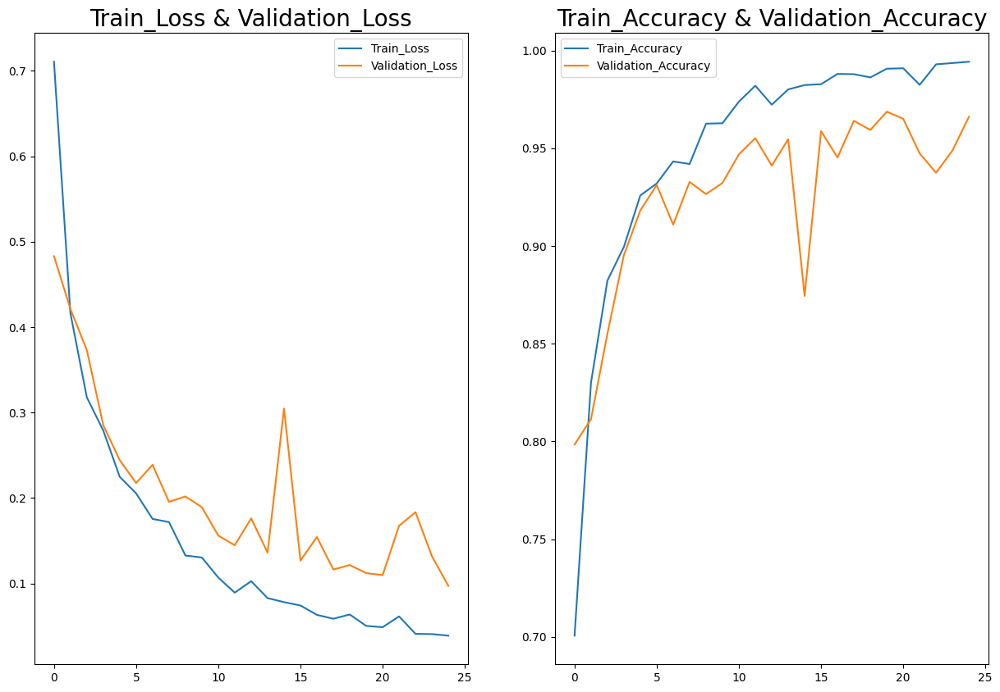

In [27]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['acc'],label='Train_Accuracy')
plt.plot(hist_['val_acc'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.show()

**2. During testing**

In [28]:
loss, accuracy = modelvgg.evaluate(X_test,y_test)
print("Loss: ", loss)
print("Accuracy: ", accuracy)

60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - acc: 0.9671 - loss: 0.0926
Loss:  0.0924701914191246
Accuracy:  0.9666666388511658


**Prediction**

In [29]:
predictions = modelvgg.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step


,Actual,Prediction
0,1,1
1,1,1
2,0,0
3,2,2
4,2,2
...,...,...
1915,2,2
1916,0,0
1917,2,2
1918,3,3


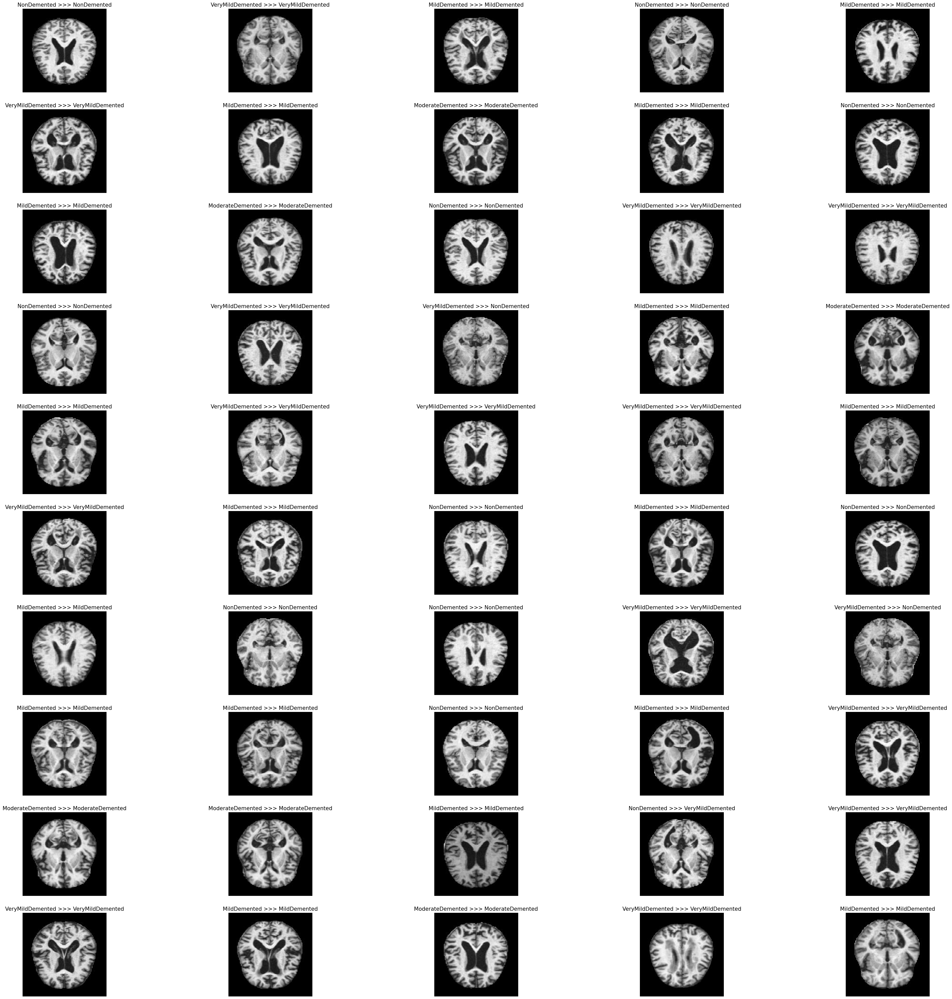

In [30]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(X_test),50)):
    plt.subplot(10,5,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f'{class_num[y_test_[i]]} >>> {class_num[y_pred[i]]}',fontsize=15)


**Classification Report**

In [31]:
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.98      0.99      0.99       480
           1       1.00      1.00      1.00       480
           2       0.95      0.93      0.94       480
           3       0.94      0.94      0.94       480

    accuracy                           0.97      1920
   macro avg       0.97      0.97      0.97      1920
weighted avg       0.97      0.97      0.97      1920



**Confusion Matrix**

array([[476,   0,   1,   3],
       [  0, 480,   0,   0],
       [  5,   0, 448,  27],
       [  4,   0,  24, 452]])

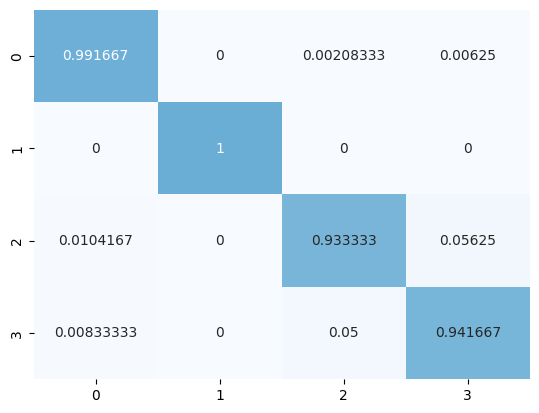

In [32]:
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

# 2. ****InceptionV3****

**Transfert Learning:** InceptionV3 is a powerful convolutional neural network (CNN) trained on the ImageNet dataset. It has learned to extract hierarchical features from images. By adding custom dense layers on top of InceptionV3, you can leverage its feature extraction capabilities while adapting it to your specific task.



1. **Base Model**: `include_top=False` means that the final fully connected layers of the InceptionV3 model (which are designed for ImageNet classification) will not be included, allowing for custom classification layers to be added.

2. **Freezing Base Model Weights**: The weights of the InceptionV3 model are set to non-trainable (`base_model.trainable = False`). This means that during training, only the weights of the additional layers added on top of the InceptionV3 model will be updated, while the weights of the InceptionV3 layers themselves will remain fixed.

3. **Custom Classification Layers**: Sequential layers are added on top of the InceptionV3 base model to perform classification:
   - *Dropout layer*: Introduces regularization by randomly setting a fraction of input units to 0 at each update during training (reducing overfitting).
   - *GlobalAveragePooling2D layer*: Computes the spatial average of the entire feature map, reducing each feature map to a single value.
   - *Flatten layer*: Flattens the input to a one-dimensional array.
   - *BatchNormalization layers*: Normalizes the activations of the previous layer at each batch, stabilizing and accelerating the training process.
   - *Dense layers*: Fully connected layers with ReLU activation function.
   - *Output layer*: Dense layer with softmax activation function, producing the final output probabilities for each class.

4. **Model Summary**: The `summary()` method is called to display a summary of the model architecture, including the number of parameters in each layer.

In [33]:
base_model = tf.keras.applications.InceptionV3(input_shape=(176,176,3), include_top=False, weights='imagenet')
base_model.trainable = False

model_Inception = keras.models.Sequential()
model_Inception.add(base_model)
model_Inception.add(keras.layers.Dropout(0.5))
model_Inception.add(keras.layers.GlobalAveragePooling2D()) 
model_Inception.add(keras.layers.BatchNormalization())
model_Inception.add(keras.layers.Dense(512, activation=tf.nn.relu))
model_Inception.add(keras.layers.BatchNormalization())
model_Inception.add(keras.layers.Dropout(0.5))
model_Inception.add(keras.layers.Dense(256, activation=tf.nn.relu))
model_Inception.add(keras.layers.BatchNormalization())
model_Inception.add(keras.layers.Dropout(0.5))
model_Inception.add(keras.layers.Dense(128, activation=tf.nn.relu))
model_Inception.add(keras.layers.BatchNormalization())
model_Inception.add(keras.layers.Dropout(0.5))
model_Inception.add(keras.layers.Dense(64, activation=tf.nn.relu))
model_Inception.add(keras.layers.BatchNormalization())
model_Inception.add(keras.layers.Dropout(0.5))
model_Inception.add(keras.layers.Dense(4, activation=tf.nn.softmax))
model_Inception.summary()


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ ?                      │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_94          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_95          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_96          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_97          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_98          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,802,784 (83.17 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 21,802,784 (83.17 MB)

NOTE: Regularization techniques such as dropout and batch normalization can help prevent overfitting by adding noise or stabilizing activations

**Plot The Model**

In [34]:
model_Inception.predict(X_train[:1])

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


array([[0.08084749, 0.6693043 , 0.09309303, 0.15675515]], dtype=float32)

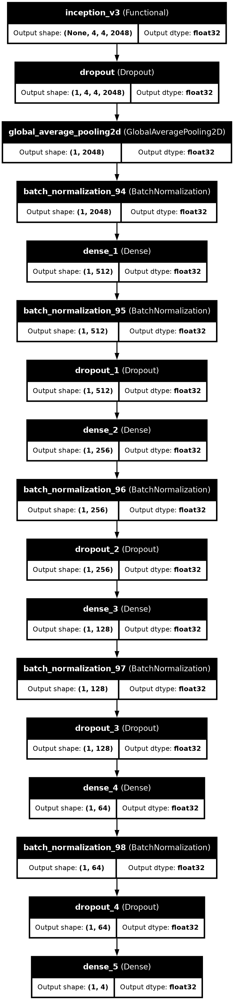

In [35]:
tf.keras.utils.plot_model(model_Inception, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

**Callbacks**

Callbacks -> Callbacks can help you fix bugs more quickly, and can help you build better models. They can help you visualize how your model’s training is going, and can even help prevent overfitting by implementing early stopping or customizing the learning rate on each iteration.

==> checkpoint_cb and early_stopping_cb

**Model Checkpoint Callback**: This callback monitors the model's performance during training and saves the model to a file (model_Inception.keras) when the validation loss decreases. The save_best_only=True parameter ensures that only the best-performing model is saved.

**Early Stopping Callback**: This callback monitors the validation loss during training and stops training if the validation loss does not improve for a certain number of epochs (patience=10). It restores the weights of the best-performing model (restore_best_weights=True) before stopping.

In [36]:
checkpoint_cb =ModelCheckpoint("model_Inception.keras", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)

**Build The Model**

In [37]:
model_Inception.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])

**Train The Model**

In [38]:
hist = model_Inception.fit(X_train,y_train, epochs=100, validation_data=(X_val,y_val), callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/100
280/280 ━━━━━━━━━━━━━━━━━━━━ 43s 68ms/step - accuracy: 0.3521 - loss: 1.7597 - val_accuracy: 0.6229 - val_loss: 0.8094
Epoch 2/100
280/280 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - accuracy: 0.5459 - loss: 0.9834 - val_accuracy: 0.6542 - val_loss: 0.7059
Epoch 3/100
280/280 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - accuracy: 0.6040 - loss: 0.8135 - val_accuracy: 0.6807 - val_loss: 0.6491
Epoch 4/100
280/280 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - accuracy: 0.6477 - loss: 0.7534 - val_accuracy: 0.7094 - val_loss: 0.6007
Epoch 5/100
280/280 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - accuracy: 0.6869 - loss: 0.6820 - val_accuracy: 0.7396 - val_loss: 0.5526
Epoch 6/100
280/280 ━━━━━━━━━━━━━━━━━━━━ 13s 45ms/step - accuracy: 0.7128 - loss: 0.6538 - val_accuracy: 0.7536 - val_loss: 0.5206
Epoch 7/100
280/280 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - accuracy: 0.7239 - loss: 0.6151 - val_accuracy: 0.7849 - val_loss: 0.4803
Epoch 8/100
280/280 ━━━━━━━━━━━━━━━━━━━━ 12s 44ms/step - accuracy: 0.7368 - loss: 0

# Evaluate The Model

**1. During Training**

In [39]:
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.419866,1.447288,0.622917,0.809367
1,0.564174,0.933775,0.654167,0.705932
2,0.611830,0.808292,0.680729,0.649089
3,0.655580,0.743266,0.709375,0.600739
4,0.686830,0.683772,0.739583,0.552624
...,...,...,...,...
67,0.954687,0.136513,0.959375,0.117864
68,0.950781,0.144579,0.954687,0.125608
69,0.954241,0.137664,0.953125,0.127268
70,0.958482,0.131646,0.952604,0.131370


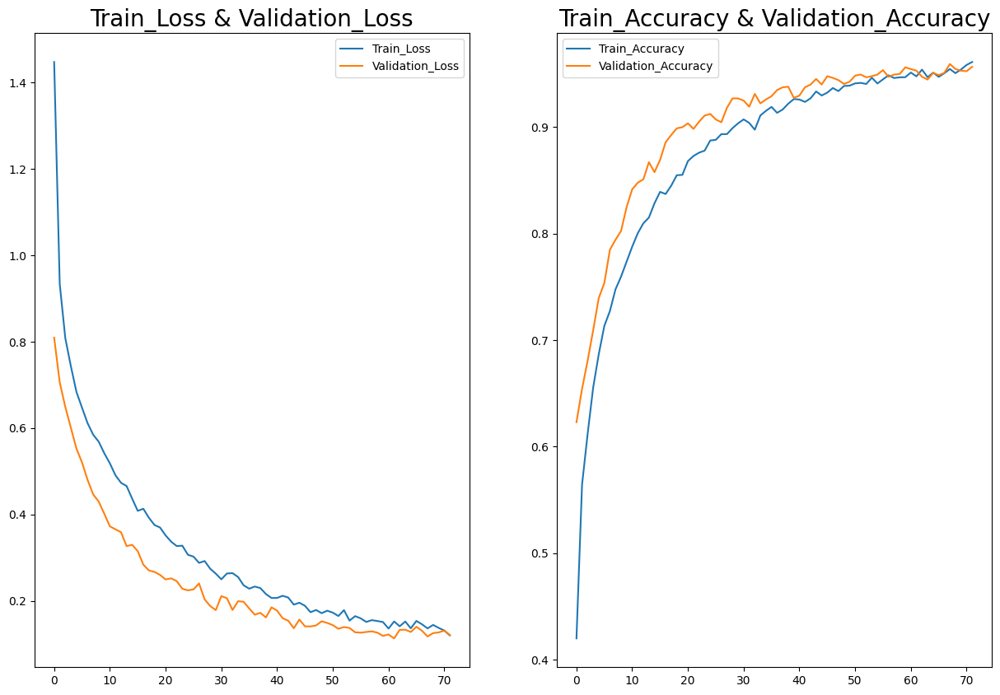

In [40]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.show()

**2. During Testing**

In [41]:
score, acc= model_Inception.evaluate(X_test,y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - accuracy: 0.9373 - loss: 0.1894
Test Loss = 0.15446101129055023
Test Accuracy = 0.9458333253860474


**Prediction**

In [42]:
predictions = model_Inception.predict(X_test)
y_pred = np.argmax(predictions,axis=1)
y_test_ = np.argmax(y_test,axis=1)
df = pd.DataFrame({'Actual': y_test_, 'Prediction': y_pred})
df

60/60 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step


,Actual,Prediction
0,1,1
1,1,1
2,0,0
3,2,2
4,2,2
...,...,...
1915,2,2
1916,0,0
1917,2,2
1918,3,3


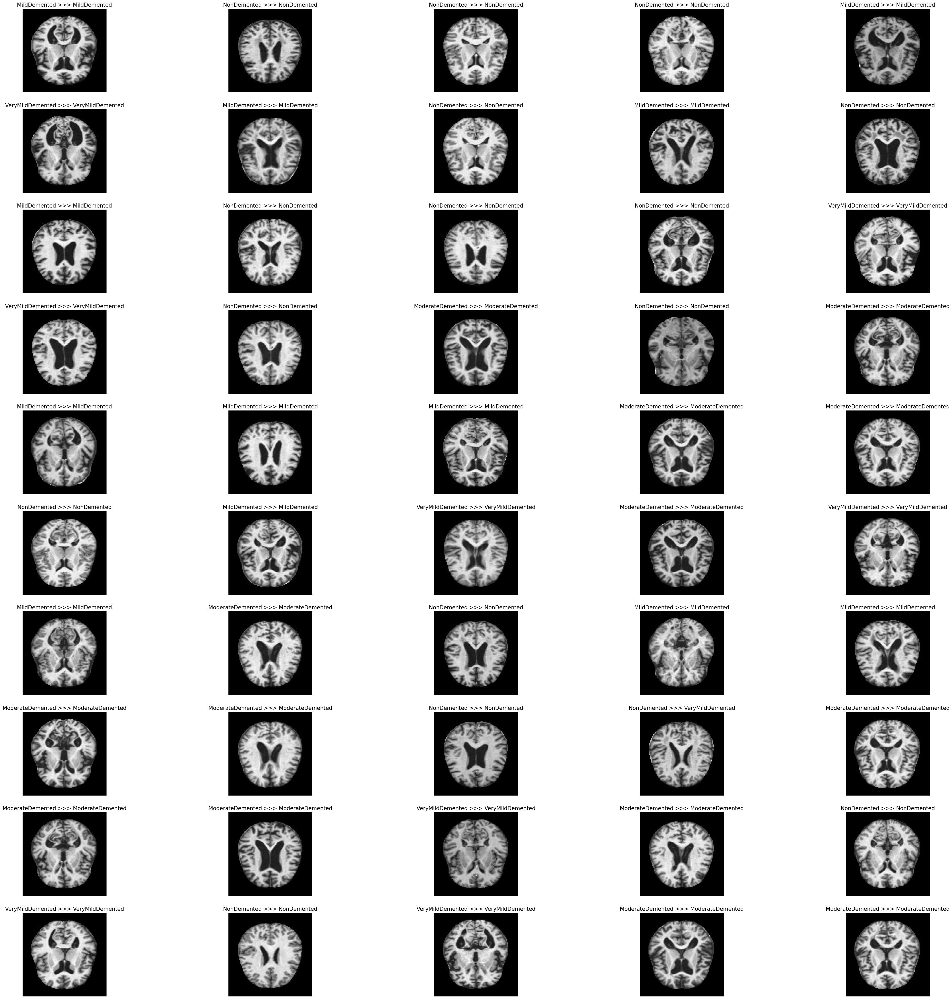

In [43]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(X_test),50)):
    plt.subplot(10,5,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f'{class_num[y_test_[i]]} >>> {class_num[y_pred[i]]}',fontsize=15)


**Classification Report**

In [44]:
ClassificationReport = classification_report(y_test_,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.97      0.98      0.97       480
           1       1.00      1.00      1.00       480
           2       0.92      0.90      0.91       480
           3       0.90      0.91      0.90       480

    accuracy                           0.95      1920
   macro avg       0.95      0.95      0.95      1920
weighted avg       0.95      0.95      0.95      1920



**Confusion Matrix**

array([[469,   0,   2,   9],
       [  0, 480,   0,   0],
       [  7,   0, 432,  41],
       [  7,   0,  38, 435]])

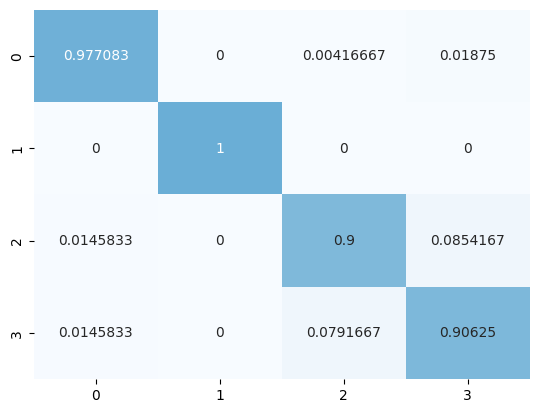

In [45]:
CM = confusion_matrix(y_test_,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

# Comparison & Chosen Model

* VGG9 : accuracy loss 97%
* Inception V3 : accuracy 95% 

==> chosen model: **VGG9**

# Saving The Model

In [46]:
from keras.models import load_model

# Save the model
modelvgg.save('alzheimers_vgg.h5')


In [ ]:

# # Save the model architecture and weights using Keras function
# model_config = model_Inception.to_json()
# with open('model_config.json', 'w') as json_file:
#     json_file.write(model_config)

# # Save the weights
# model_Inception.save_weights('model.weights.h5')



In [ ]:
# from keras.models import load_model

# # Save the model
# model_Inception.save('alzheimers_model.h5')

# # Later, you can load the model
# loaded_model = load_model('alzheimers_model.h5')
